# GANs for Image Upscaling

In [1]:
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import torch
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import cv2
import numpy as np
import matplotlib.pyplot as plt

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Objective

Develop a model capable of enhancing image resolution in a realistic manner.

In this tutorial, we will delve into the realm of Super-resolution (SR) models, which possess the remarkable ability to generate new pixels in areas where they previously did not exist. Our goal is to expand an image's dimensions by fourfold, effectively increasing the pixel count by a factor of 16!

Our focus will be on implementing a state-of-the-art technique known as Photo-Realistic Single Image Super-Resolution using a Generative Adversarial Network (GAN). This approach is particularly exciting not only because of its impressive results but also because it serves as an excellent introduction to the world of GANs, a groundbreaking concept in the field of machine learning and artificial intelligence.

#

# Image Upsampling Methods
Image upsampling refers to the technique of **artificially enhancing the spatial resolution of an image** – essentially increasing the pixel count that represents the image's content.

**Upsampling is a prevalent process**; it occurs every time you zoom into a photo on your smartphone or view a 480p video on a 1080p screen. It's important to note that this process does not involve AI, and as a result, the image may start to look blurry or pixelated when viewed at a resolution higher than its original encoding.

In contrast to the neural super-resolution we'll explore in this tutorial, standard upsampling methods don't aim to create a high-quality approximation of what an image might look like at a higher resolution. Instead, their use is more practical, as images often need resizing to fit different display or print formats. For instance, adjusting an image to fill a specific area of a 1080p screen or to be printed on A4 paper is common, but it's unlikely that the image's original resolution will exactly match the screen's or printer's resolution. While upsampling does increase resolution, the image often still looks like a low-resolution, low-detail picture, just displayed at a higher resolution, possibly with some added smoothing or sharpening effects.

Interestingly, images upscaled with these methods can serve as a stand-in for the original low-resolution image, allowing for comparison with their super-resolved counterparts, both in research papers and in this tutorial. To display a low-resolution image at the same physical size as a super-resolved image (measured in inches on your screen), upsampling is necessary (downsampling the super-resolved image would be counterproductive).

Now, let's examine some typical upsampling techniques.

## Nearest Neighbour Upsampling
This is the simplest way to upsample an image and essentially amounts to stretching the image as-is.  Consider a small image with a black diagonal line, with red on one side and gray on the other. We first create new, empty pixels between known pixels at the desired resolution. We then assign each new pixel the value of its nearest neighbor whose value we do know.







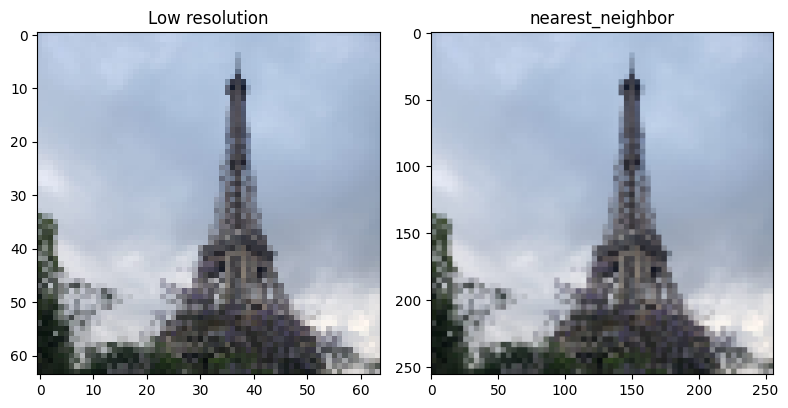

In [2]:
def nearest_neighbor(image_path):
    f_in  = image_path
    img = cv2.imread(f_in)
    img_bis = cv2.resize(img, (256,256), interpolation=cv2.INTER_NEAREST_EXACT)
    return img_bis,img

image_path = f"/kaggle/input/2024-upscale/downscaled/downscaled/{10:02}.png"
sr_img_nn, original = nearest_neighbor(image_path)
    
plt.figure(figsize=(8, 5))  # Adjust the figure size as needed

# Add the first image and metrics to the left subplot
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("Low resolution")


plt.subplot(1, 2,2)
plt.imshow(cv2.cvtColor(sr_img_nn, cv2.COLOR_BGR2RGB))
plt.title("nearest_neighbor")



# Display the images
plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()


## Bicubic interpolation


Here too, we create empty pixels such that the image is at the target resolution. These pixels must now be painted in. If we perform linear interpolation using the two closest known pixels (i.e., one on each side), it is bilinear upsampling.



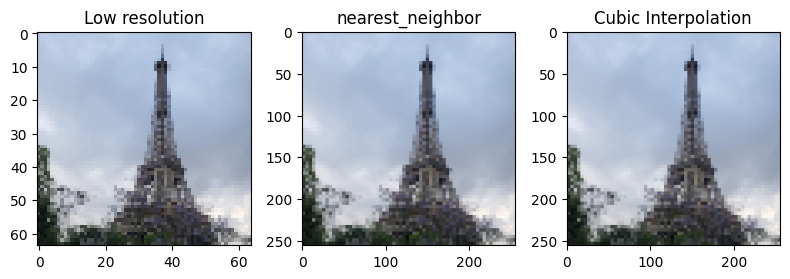

In [3]:
def inter_cubic(image_path):
    f_in  = image_path
    img = cv2.imread(f_in)
    img_bis = cv2.resize(img, (256,256), interpolation=cv2.INTER_CUBIC)
    return img_bis,img



image_path = f"/kaggle/input/2024-upscale/downscaled/downscaled/{10:02}.png"
sr_img_ci, original = nearest_neighbor(image_path)
    
plt.figure(figsize=(8, 5))  # Adjust the figure size as needed

# Add the first image and metrics to the left subplot
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
plt.title("Low resolution")


plt.subplot(1, 3,2)
plt.imshow(cv2.cvtColor(sr_img_nn, cv2.COLOR_BGR2RGB))
plt.title("nearest_neighbor")

plt.subplot(1, 3,3)
plt.imshow(cv2.cvtColor(sr_img_ci, cv2.COLOR_BGR2RGB))
plt.title("Cubic Interpolation")




# Display the images
plt.tight_layout()  # Ensures proper spacing between subplots
plt.show()


## The Super-Resolution Generative Adversarial Network (SRGAN)

The SRGAN (Super-Resolution Generative Adversarial Network) is composed of two key components: a Generator network and a Discriminator network.

The purpose of the Generator is to enhance low-resolution images to a high-resolution format in a manner so realistic that the Discriminator, which is adept at identifying artificially generated images, struggles to differentiate between real and super-resolved images.

These networks are trained simultaneously. The training of the Generator involves not just reducing content loss, as seen in SRResNet, but also involves learning from the Discriminator's strategies.

In this setup, we play a crucial role akin to a spy in the Discriminator's camp. By feeding the Generator information about the Discriminator's internal processes, specifically the gradients generated during backpropagation from its output, the Generator can fine-tune its own parameters. This adjustment enables the Generator to influence the Discriminator's output in its favor.

As the Generator gets better at producing high-quality, realistic high-resolution images, these images are then used to further train the Discriminator, enhancing its ability to discern images.

### The Discriminator Architecture
As you might expect, the Discriminator is a convolutional network that functions as a binary image classifier.


The architecture consists of the following components:

A high-resolution image is processed using a convolution operation with a large 9x9 kernel and a stride of 1, resulting in a feature map of the same resolution with 64 channels. This step applies a leaky ReLU activation function.

The generated feature map goes through seven convolutional blocks. Each block contains a 3x3 convolution, batch normalization, and leaky ReLU activation. The channel count is doubled in blocks with an even index, while the spatial dimensions of the feature map are halved in blocks with an odd index by using a stride of 2.

The output from the series of convolutional blocks is then flattened and linearly transformed into a 1024-size vector, which is then passed through a leaky ReLU activation.

A final linear transformation produces a single value, which is transformed into a probability score using the sigmoid activation function. This score represents the likelihood that the input image is an actual (authentic) image.

### Interleaved training
Interleaved training refers to the simultaneous training process of both the Generator and Discriminator within a GAN framework. Rather than training one completely before starting on the other, both are trained concurrently.

In general, a GAN's training process alternates between short training phases for each network. For the specific approach discussed in the paper, the training regimen involves updating each network (Generator and Discriminator) only once before switching to the other. This means that after one update of the Generator, the Discriminator is updated once, and this alternating pattern continues throughout the training process.



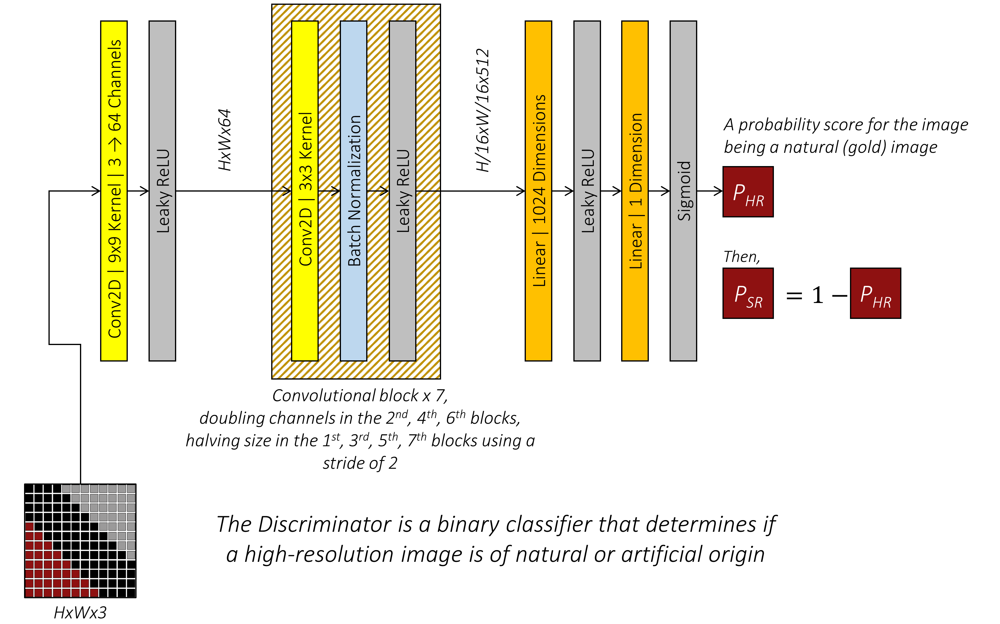

In [4]:
!git clone https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Super-Resolution.git

Cloning into 'a-PyTorch-Tutorial-to-Super-Resolution'...
remote: Enumerating objects: 99, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 99 (delta 8), reused 48 (delta 4), pack-reused 47
Receiving objects: 100% (99/99), 35.67 MiB | 12.63 MiB/s, done.
Resolving deltas: 100% (14/14), done.


In [5]:
!pip install gdown

  Obtaining dependency information for gdown from https://files.pythonhosted.org/packages/9e/db/c5dad38733f0995dea4480de38df1b3f6222b77b0dc89aad2402d86e2ff4/gdown-5.0.1-py3-none-any.whl.metadata


In [6]:
%cd a-PyTorch-Tutorial-to-Super-Resolution
!gdown --id 1_PJ1Uimbr0xrPjE8U3Q_bG7XycGgsbVo

/kaggle/working/a-PyTorch-Tutorial-to-Super-Resolution
/opt/conda/lib/python3.10/site-packages/gdown/cli.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1_PJ1Uimbr0xrPjE8U3Q_bG7XycGgsbVo
To: /kaggle/working/a-PyTorch-Tutorial-to-Super-Resolution/checkpoint_srgan.pth.tar
100%|████████████████████████████████████████| 101M/101M [00:03<00:00, 33.0MB/s]


In [7]:
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import torch
from utils import *
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import cv2
import numpy as np
import matplotlib.pyplot as plt

## Utils

In [8]:
def imgs_to_csv(img_paths, csv_path):
    with open(csv_path, 'w') as f:
        # write header
        f.write('id,b,g,r\n')
        n = 1
        for img_path in img_paths:
            # open image with opencv
            img = cv2.imread(img_path)
            width, height, _ = img.shape
            for x in range(width):
                for y in range(height):
                    # write pixel value to csv file
                    f.write(str(n) + ','\
                            + str(img[x,y,0]) + ',' \
                            + str(img[x,y,1]) + ',' \
                            + str(img[x,y,2]) + '\n')
                    n += 1
            

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

# Model checkpoints
srgan_checkpoint = "./checkpoint_srgan.pth.tar"

# Load models
srgan_generator = torch.load(srgan_checkpoint)['generator'].to(device)
srgan_generator.eval()

cuda


/kaggle/working/a-PyTorch-Tutorial-to-Super-Resolution/models.py:255: SyntaxWarning: "is" with a literal. Did you mean "=="?
  out_channels = (n_channels if i is 0 else in_channels * 2) if i % 2 is 0 else in_channels
/kaggle/working/a-PyTorch-Tutorial-to-Super-Resolution/models.py:255: SyntaxWarning: "is" with a literal. Did you mean "=="?
  out_channels = (n_channels if i is 0 else in_channels * 2) if i % 2 is 0 else in_channels
/kaggle/working/a-PyTorch-Tutorial-to-Super-Resolution/models.py:258: SyntaxWarning: "is" with a literal. Did you mean "=="?
  stride=1 if i % 2 is 0 else 2, batch_norm=i is not 0, activation='LeakyReLu'))
/kaggle/working/a-PyTorch-Tutorial-to-Super-Resolution/models.py:258: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  stride=1 if i % 2 is 0 else 2, batch_norm=i is not 0, activation='LeakyReLu'))
/opt/conda/lib/python3.10/site-packages/torch/serialization.py:888: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' 

Generator(
  (net): SRResNet(
    (conv_block1): ConvolutionalBlock(
      (conv_block): Sequential(
        (0): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
        (1): PReLU(num_parameters=1)
      )
    )
    (residual_blocks): Sequential(
      (0): ResidualBlock(
        (conv_block1): ConvolutionalBlock(
          (conv_block): Sequential(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): PReLU(num_parameters=1)
          )
        )
        (conv_block2): ConvolutionalBlock(
          (conv_block): Sequential(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
        )
      )
      (1): ResidualBlock(
        (conv_block1): ConvolutionalBlock(
          (conv_block): Seque

In [10]:
def plot_results(original, upscaled, interp, nearest_neighbor):
    # Create a figure with two subplots side by side
    plt.figure(figsize=(12, 5))  # Adjust the figure size as needed

    # Add the first image and metrics to the left subplot
    plt.subplot(1, 4, 1)
    plt.imshow(original)
    plt.title("Low resolution")

    plt.subplot(1, 4, 2)
    plt.imshow(upscaled)
    plt.title("SRGAN")
    
    plt.subplot(1, 4, 3)
    plt.imshow(cv2.cvtColor(interp, cv2.COLOR_BGR2RGB))
    plt.title("Cubic Interpo")
    
    plt.subplot(1, 4, 4)
    plt.imshow(cv2.cvtColor(nearest_neighbor, cv2.COLOR_BGR2RGB))
    plt.title("nearest_neighbor")

    

   

    # Display the images
    plt.tight_layout()  # Ensures proper spacing between subplots
    plt.show()


In [11]:
def upscale(image_path, save_img=False, output_path=None):
    hr_img = Image.open(image_path, mode="r") # put any other file instead or make a loop going around a full folder
    hr_img = hr_img.convert('RGB')
    sr_img_srgan = srgan_generator(convert_image(hr_img, source='pil', target='imagenet-norm').unsqueeze(0).to(device))
    sr_img_srgan = sr_img_srgan.squeeze(0).cpu().detach()
    sr_img_srgan = convert_image(sr_img_srgan, source='[-1, 1]', target='pil')
    if save_img and output_path is not None:
        # Construct the save path (you can modify this as needed)
        sr_img_srgan.save(output_path)
    return hr_img, sr_img_srgan

In [12]:
! mkdir /kaggle/working/Upscaled_images/

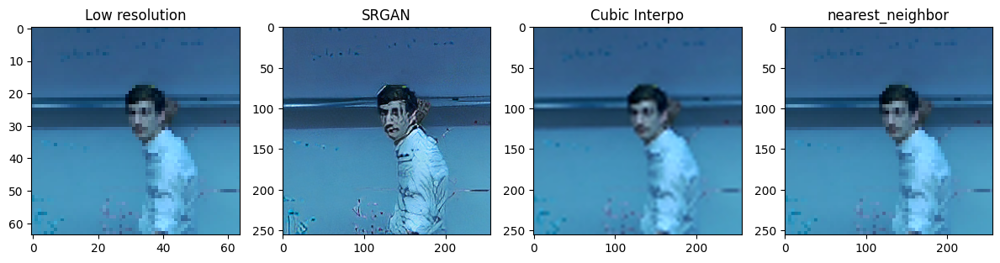

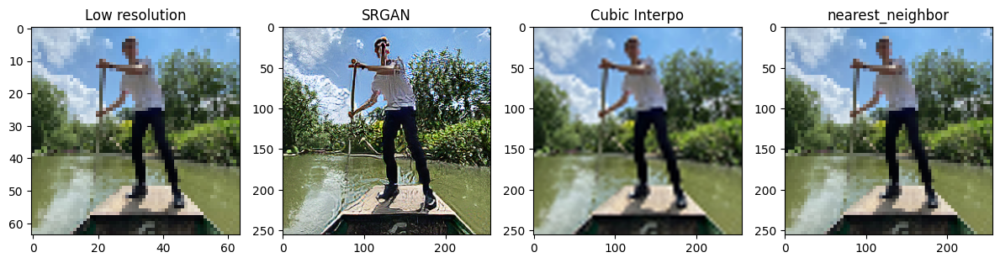

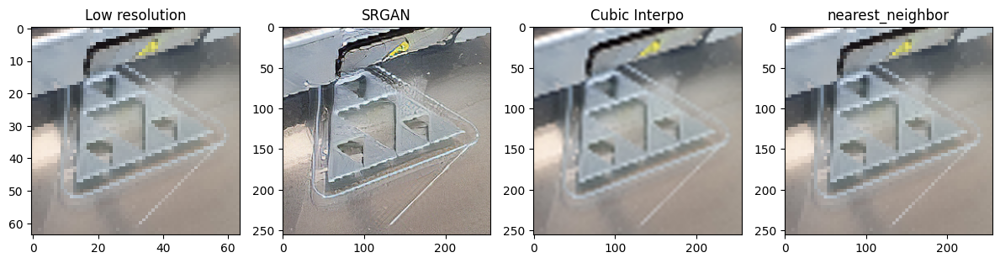

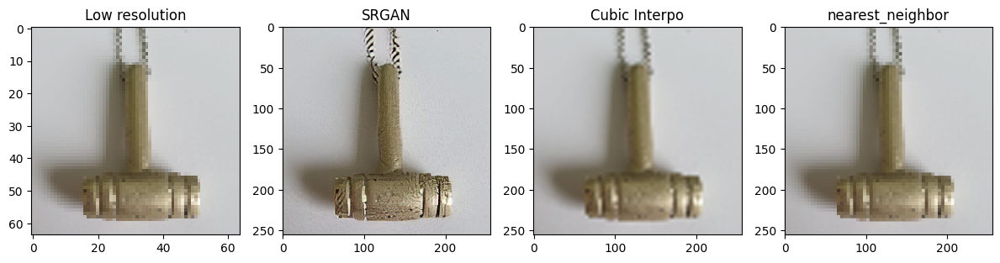

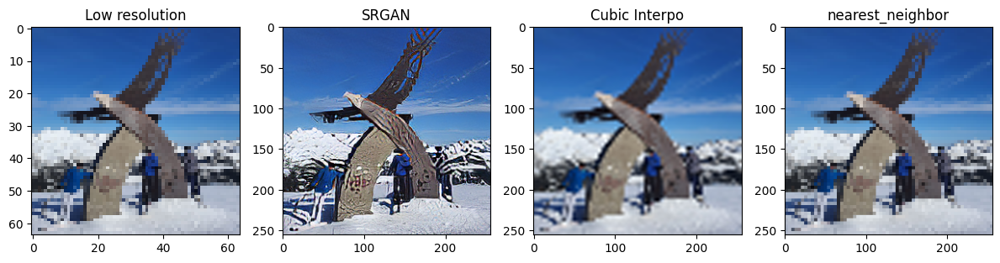

...

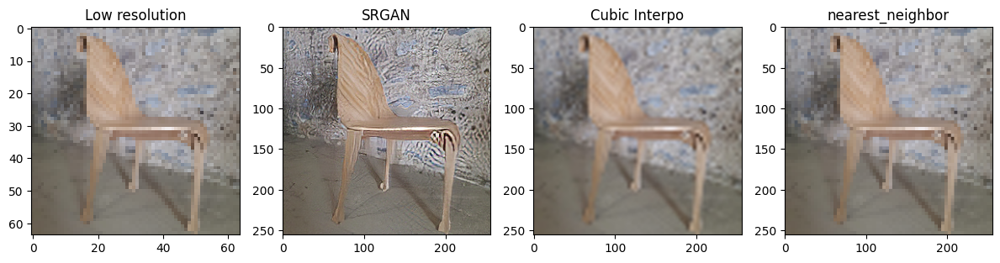

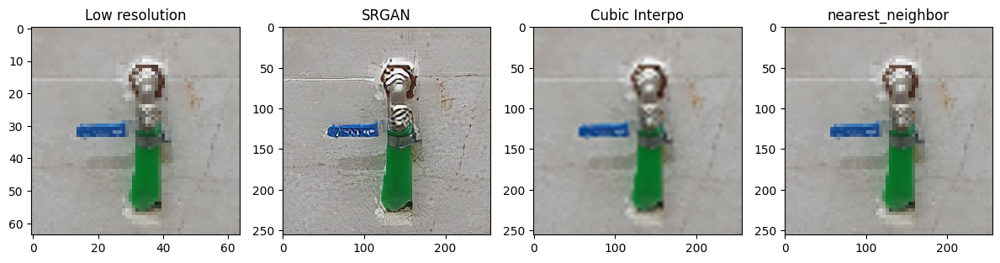

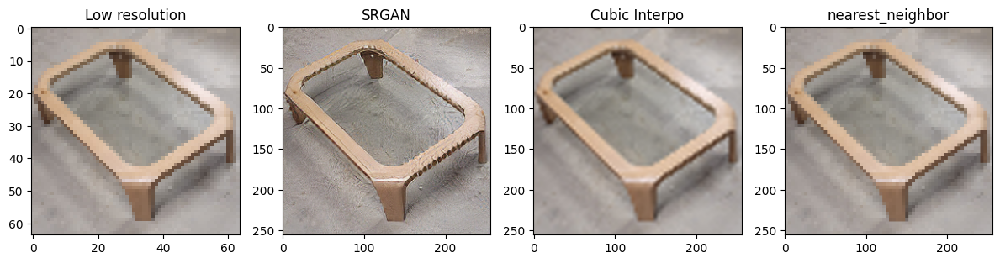

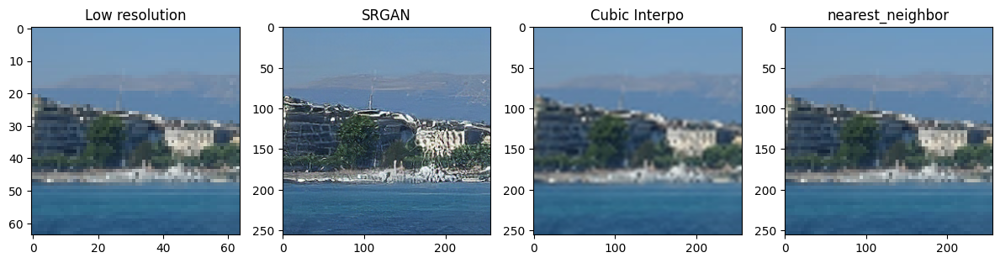

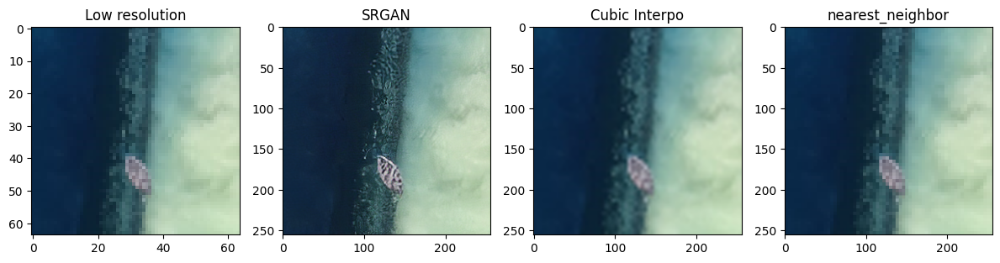

In [13]:
for k in range(31):
    image_path = f"/kaggle/input/2024-upscale/downscaled/downscaled/{k:02}.png"
    output_path = f"/kaggle/working/Upscaled_images/{k:02}.png"
    hr_img, sr_img_srgan = upscale(image_path, save_img=True, output_path=output_path)
    sr_img_inter,_ = inter_cubic(image_path)
    sr_img_nn,_ = nearest_neighbor(image_path)
    plot_results(hr_img, sr_img_srgan, sr_img_inter, sr_img_nn)


In [14]:
img_paths = [f'/kaggle/working/Upscaled_images/{n:02d}.png' for n in range(1,31)]
csv_path = '/kaggle/working/Submission.csv'
imgs_to_csv(img_paths, csv_path)

In [15]:
! ls /kaggle/working/

Submission.csv	 __notebook__.ipynb
Upscaled_images  a-PyTorch-Tutorial-to-Super-Resolution
